## Importing required modules

In [1]:
import pandas as pd
import numpy as np
import os

from matplotlib import pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from collections import Counter
import cv2

# Importing Image module from PIL package 
from PIL import Image 
import PIL 

seed = 137

### Putting all images' path in a dataframe for easy access

In [2]:
train = pd.DataFrame()
images = []
for dirname, _, filenames in os.walk('images'):
    for filename in filenames:
        images.append(os.path.join(dirname, filename))
train.insert(0, 'image_path', images)

In [3]:
train

,image_path
0,images\CMF3CM2-Zircon+Col+Tantalite.png
1,images\ElSellaE1-Zircon+Thorite+xenotime.png
2,images\ElSellaE5+zircon+Thorit+Xenotime.png
3,images\ElSellaE6 monazite +Thorite in zircon.png
4,images\ElSellaYNbOxide+Col+Monazite+Zircon+.png
5,images\ES11+Zircon+Thorite.png
6,images\FMF1F1 Zircon.png
7,images\FMF1F2b Zircon.png
8,images\FMF1F3 Zircon.png
9,images\LD zircon+Xenotime+Apatite (2).png


## clustering all images 

### selecting images and their corresponding number of clusters

In [426]:
index = 38

image_content = train.iloc[index]['image_path'][7: -4].split('+')
print('the materials inside the image are:  ',image_content, '\n')
N_clusters = len(image_content) + 1
print('the number of proper clusters is:  ', N_clusters,'clusters', '\n')

the materials inside the image are:   ['Zr', 'urano', 'Xen'] 

the number of proper clusters is:   4 clusters 



### Reading some samples

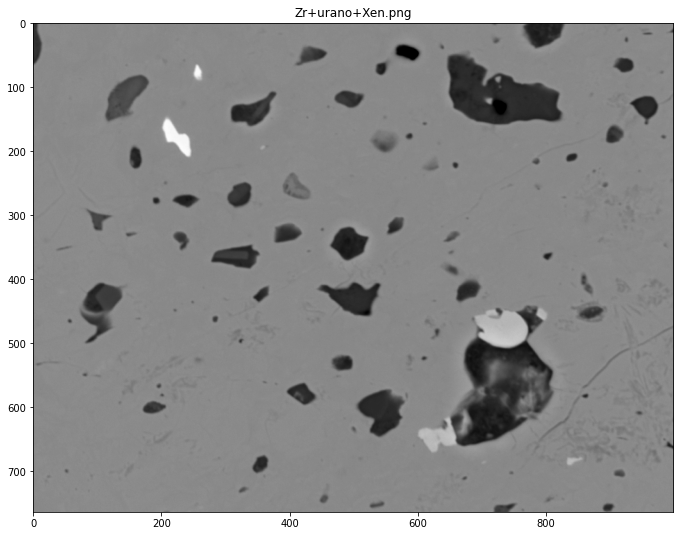

In [410]:
plt.figure(figsize=(15,9))
img = cv2.imread(train.iloc[index].image_path) 
plt.title(train.iloc[index].image_path[7:])
plt.imshow(img)

### Histogram ( pixels distribution )

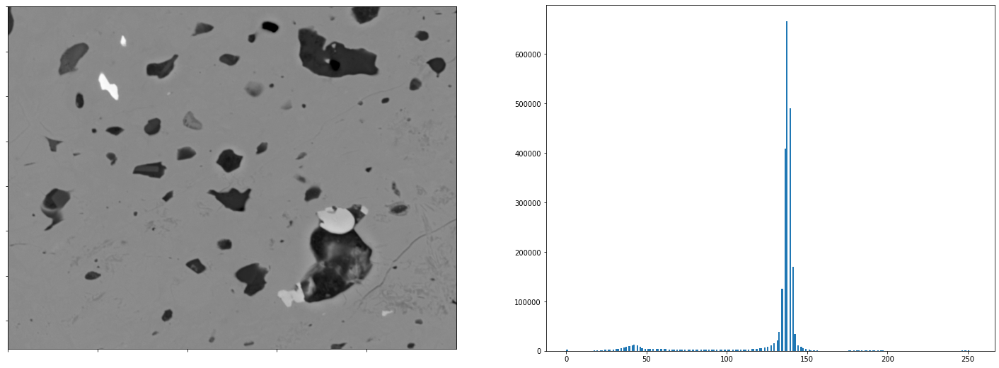

In [411]:
# Reshape as 1D array
img_flat = img.reshape((-1, 1))
plt.figure(figsize=(25,9))
fig = plt.figure(1)

ax1 = fig.add_subplot(1,2,1)
ax1.imshow(img,cmap=plt.cm.gray)

ax2 = fig.add_subplot(1,2,2)
# Plot the histogram with 256 bins
ax2.hist(img_flat,256)

ax1.set_xticklabels([])
ax1.set_yticklabels([])

plt.show()

## Image clustering

In [416]:
""" Image clustering """
# read the image
image = cv2.imread(train.iloc[index].image_path)
# number of clusters (K)
# K = N_clusters
# reshape the image to a 2D array of pixels and 3 color values (RGB)
pixel_values = image.reshape((-1, 3))
# convert to float
vectorized = np.float32(pixel_values)
print(vectorized.shape)

kmeans = KMeans(random_state= seed, init='random', n_clusters= 5)   # N_clusters
labels = kmeans.fit_predict(vectorized)
print(labels.shape)

# reshape back to the original image dimension
segmented_image = labels.reshape(image.shape[0:2])

(764000, 3)
(764000,)


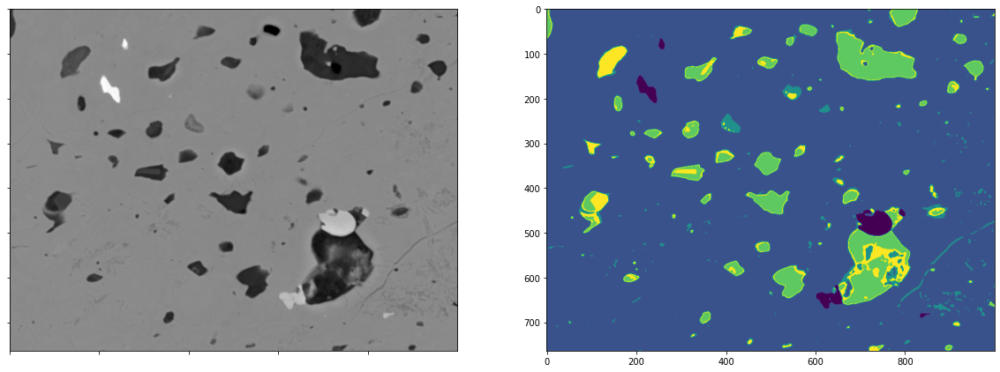

In [417]:
# show the image
plt.figure(figsize=(20, 10))
fig = plt.figure(1)

ax1 = fig.add_subplot(1,2,1)
ax1.imshow(img,cmap=plt.cm.gray)

ax2 = fig.add_subplot(1,2,2)
# Plot the segmented image
ax2.imshow(segmented_image)

ax1.set_xticklabels([])
ax1.set_yticklabels([])

plt.show()


In [418]:
(labels.flatten()).tolist().count(0) 

6552

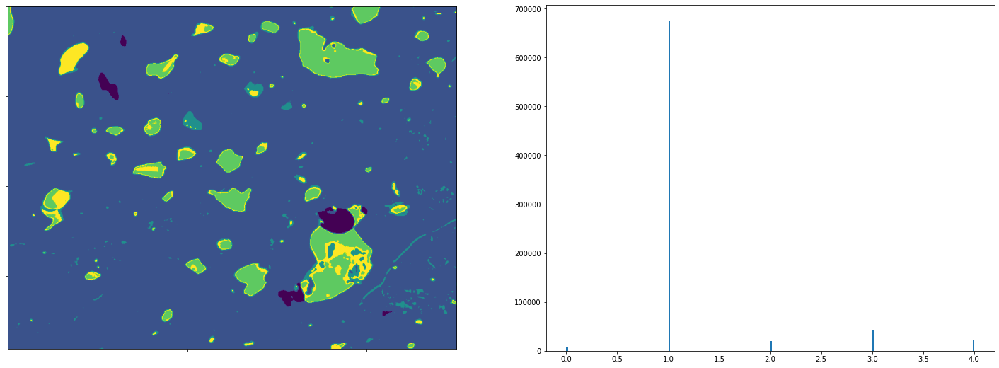

In [419]:
# Reshape as 1D array
img_flat = segmented_image.reshape((-1, 1))
plt.figure(figsize=(25,9))
fig = plt.figure(1)

ax1 = fig.add_subplot(1,2,1)
ax1.imshow(segmented_image)

ax2 = fig.add_subplot(1,2,2)
# Plot the histogram with 256 bins
ax2.hist(img_flat,256)

ax1.set_xticklabels([])
ax1.set_yticklabels([])

plt.show()

In [420]:
labels_count = Counter(labels)  
print(labels_count)

Counter({1: 674355, 3: 41574, 4: 21203, 2: 20316, 0: 6552})


In [421]:
# disable the cluster (turn the pixel into black)
masked_image = np.copy(image)

# convert to the shape of a vector of pixel values
masked_image = masked_image.reshape((-1, 3))

# color (i.e cluster) to disable
cluster = 0
masked_image[labels == cluster] = [0, 0, 0]

cluster = 1
masked_image[labels == cluster] = [0, 0, 0]

cluster = 3
masked_image[labels == cluster] = [0, 0, 0]

cluster = 4
masked_image[labels == cluster] = [0, 0, 0]

cluster = 5
masked_image[labels == cluster] = [0, 0, 0]

cluster = 2
masked_image[labels == cluster] = [0, 0, 0]

cluster = 6
masked_image[labels == cluster] = [0, 0, 0]


cluster = 1
masked_image[labels == cluster] = [255, 255, 255]

# convert back to original shape
masked_image = masked_image.reshape(image.shape)


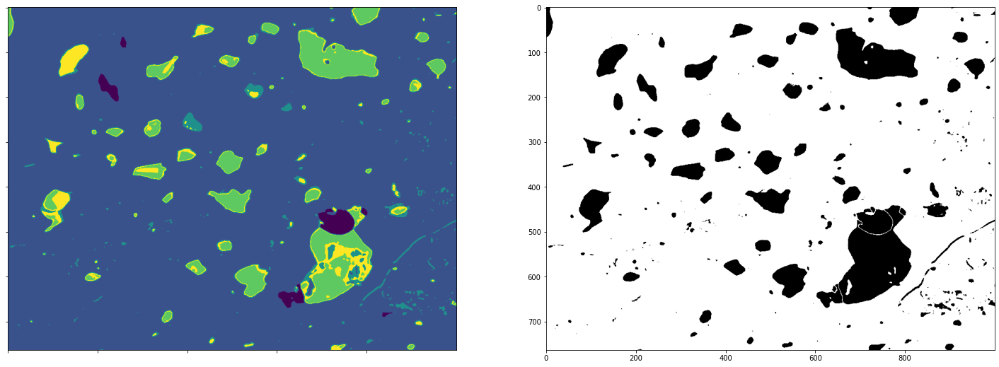

In [422]:
# show the segmented image and the desired cluster
plt.figure(figsize=(25,10))
fig = plt.figure(1)

ax1 = fig.add_subplot(1,2,1)
ax1.imshow(segmented_image)

ax2 = fig.add_subplot(1,2,2)
# Plot the histogram with 256 bins
ax2.imshow(masked_image)

ax1.set_xticklabels([])
ax1.set_yticklabels([])

plt.show()

# showing original image --> clustered image -->  mask

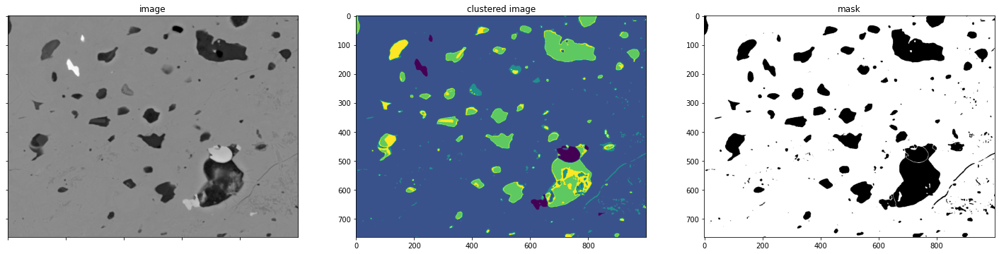

In [423]:
# show the segmented image and the desired cluster
plt.figure(figsize=(25,10))
fig = plt.figure(1)

ax1 = fig.add_subplot(1,3,1)
ax1.imshow(img)
ax1.set_title('image')

ax2 = fig.add_subplot(1,3,2)
ax2.imshow(segmented_image)
ax2.set_title('clustered image')

ax3 = fig.add_subplot(1,3,3)
ax3.imshow(masked_image)
ax3.set_title('mask')

ax1.set_xticklabels([])
ax1.set_yticklabels([])

plt.show()

### Saving masks

In [424]:
path = 'another masks'

cv2.imwrite(os.path.join(path , train.iloc[index].image_path[7:]), masked_image)

True

# Reading some info for each mask

In [20]:
masks = pd.DataFrame()
images = []
for dirname, _, filenames in os.walk('masks'):
    for filename in filenames:
        images.append(os.path.join(dirname, filename))
masks.insert(0, 'image_path', images)

In [21]:
masks

,image_path
0,masks\Zircolite+Thor+Zr.png
1,masks\Zr + Thor+col+Zrconlite.png
2,masks\Zr +Col+Mon.png
3,masks\Zr+Col (3).png
4,masks\Zr+Col+Mon+Urano.png
5,masks\Zr+Col+Urano+Xen.png
6,masks\Zr+Kas+Col+Urano.png
7,masks\Zr+Rt+Mon.png
8,masks\Zr+Thor+Col.png
9,masks\Zr+Uran+Mon+Xen.png


In [23]:
def show_info(no_sample_in_data):
    
    index = no_sample_in_data

    mask = cv2.imread(masks.iloc[index].image_path, 0) 
    image = cv2.imread(train.iloc[index].image_path)
    
    mask_flat = mask.reshape((-1, 1))
    # mask info
    mask_flat_ = np.array(mask_flat).squeeze().tolist()
    print('# of all pixels in a sample is: {}'.format(len(mask_flat_)))
    print('# of pixels labeled as Zircon is: {}'.format(mask_flat_.count(255)), 
          '\nPercentage of Zircon is: {}%'.format(mask_flat_.count(255)/ len(mask_flat)*100) )
    print('# of pixels labeled as Background is: {}'.format(mask_flat_.count(0)),  
          '\nPercentage of Background is: {}%'.format(mask_flat_.count(0)/ len(mask_flat)*100))
    print('#'*20)
    
    plt.figure(figsize=(25,9))
    fig = plt.figure(1)

    ax1 = fig.add_subplot(1,2,1)
    ax1.imshow(image)

    ax2 = fig.add_subplot(1,2,2)
    ax2.imshow(mask, cmap = 'gray')

    ax1.set_xticklabels([])
    ax1.set_yticklabels([])

    plt.show()
 
    

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 269875 
Percentage of Zircon is: 35.32395287958115%
# of pixels labeled as Background is: 494125 
Percentage of Background is: 64.67604712041884%
####################


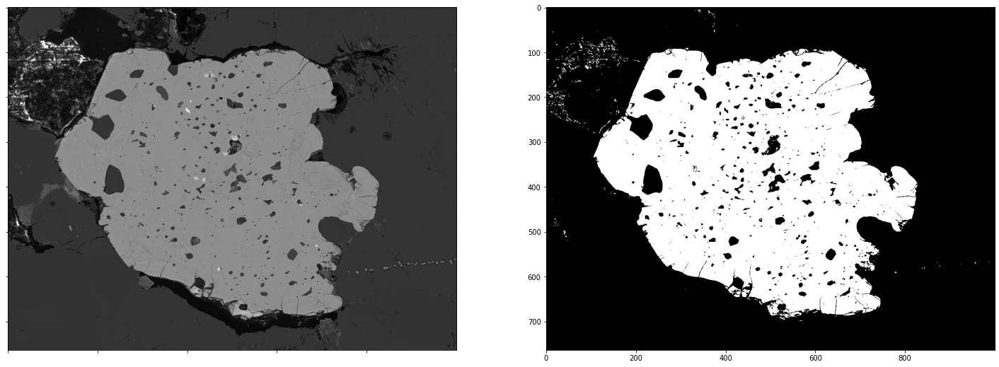

In [24]:
show_info(10)

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 85675 
Percentage of Zircon is: 11.214005235602095%
# of pixels labeled as Background is: 678325 
Percentage of Background is: 88.7859947643979%
####################


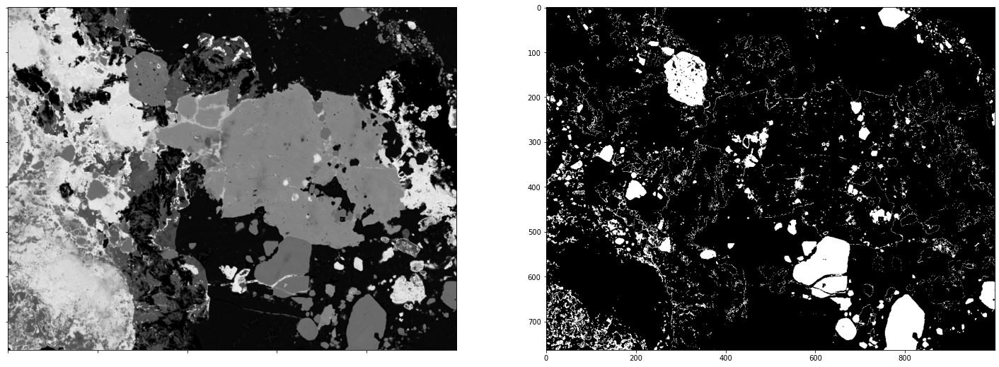

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 135259 
Percentage of Zircon is: 17.704057591623037%
# of pixels labeled as Background is: 628741 
Percentage of Background is: 82.29594240837696%
####################


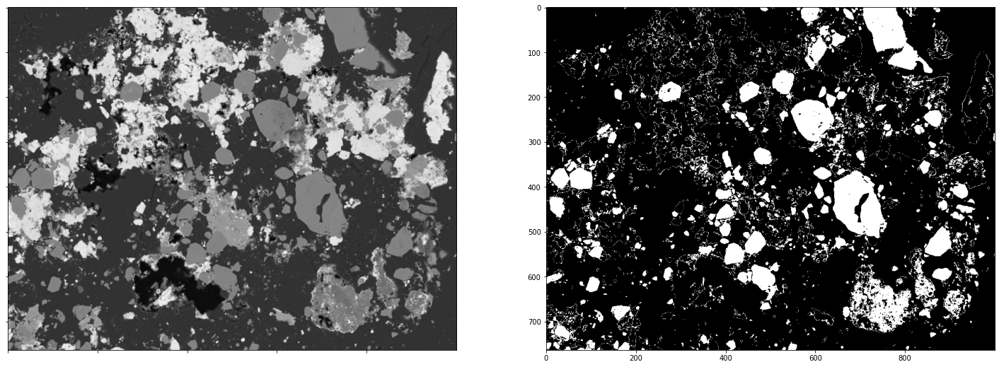

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 45651 
Percentage of Zircon is: 5.975261780104712%
# of pixels labeled as Background is: 718349 
Percentage of Background is: 94.02473821989528%
####################


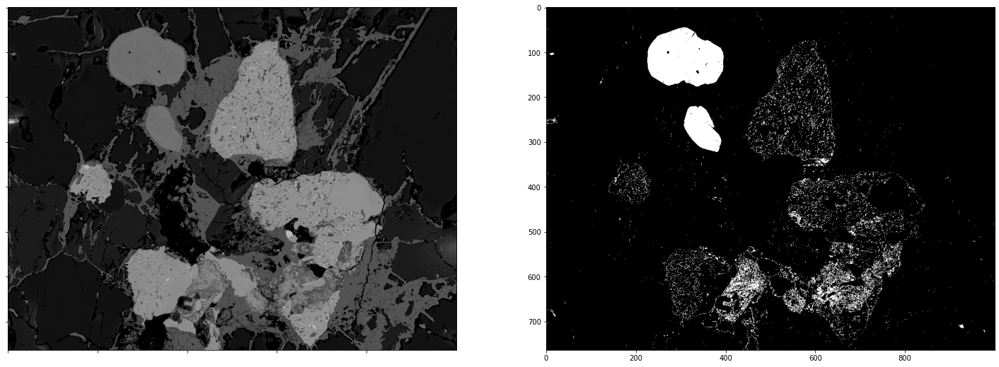

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 671333 
Percentage of Zircon is: 87.87081151832462%
# of pixels labeled as Background is: 92667 
Percentage of Background is: 12.129188481675394%
####################


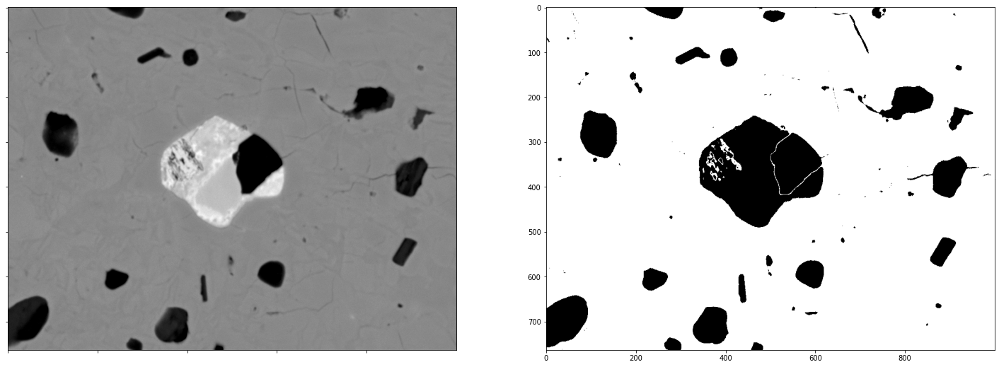

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 140718 
Percentage of Zircon is: 18.418586387434555%
# of pixels labeled as Background is: 623282 
Percentage of Background is: 81.58141361256544%
####################


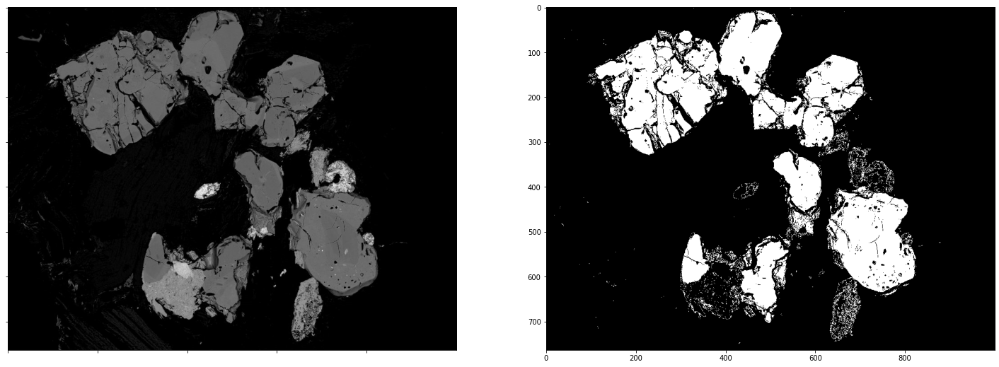

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 330099 
Percentage of Zircon is: 43.20667539267016%
# of pixels labeled as Background is: 433901 
Percentage of Background is: 56.79332460732984%
####################


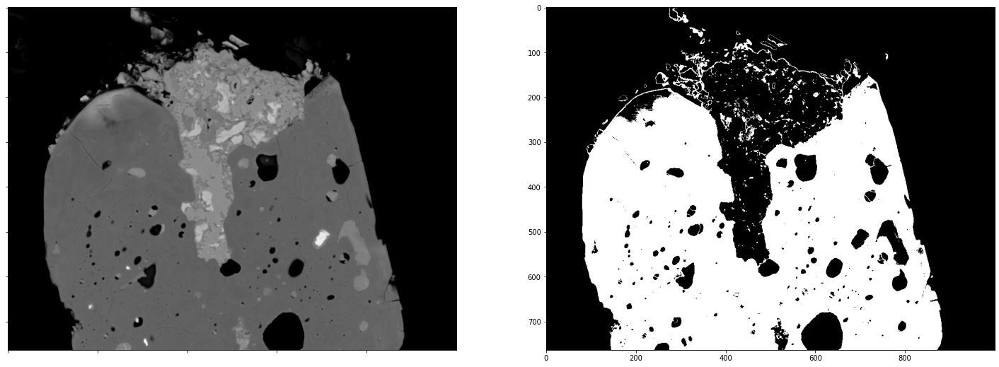

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 303241 
Percentage of Zircon is: 39.69123036649215%
# of pixels labeled as Background is: 460759 
Percentage of Background is: 60.30876963350785%
####################


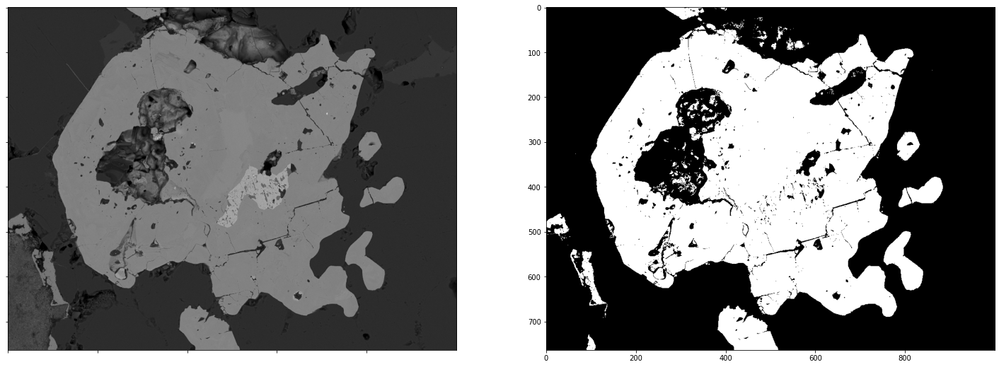

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 161151 
Percentage of Zircon is: 21.093062827225133%
# of pixels labeled as Background is: 602849 
Percentage of Background is: 78.90693717277487%
####################


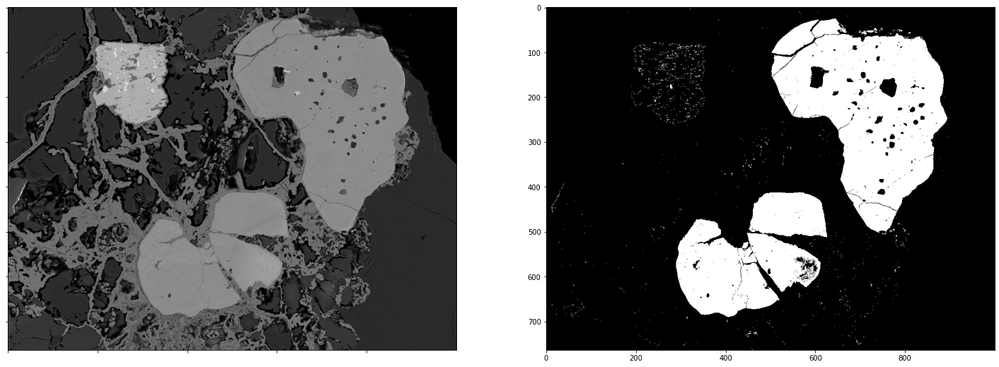

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 9112 
Percentage of Zircon is: 1.192670157068063%
# of pixels labeled as Background is: 754888 
Percentage of Background is: 98.80732984293194%
####################


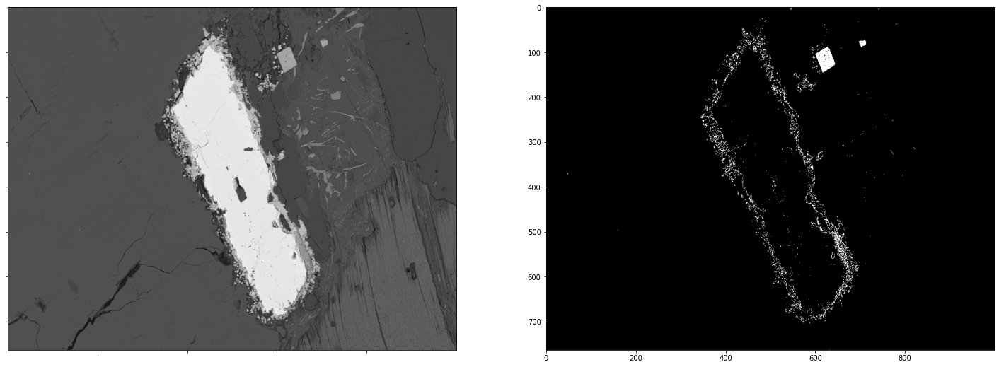

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 97971 
Percentage of Zircon is: 12.823429319371726%
# of pixels labeled as Background is: 666029 
Percentage of Background is: 87.17657068062827%
####################


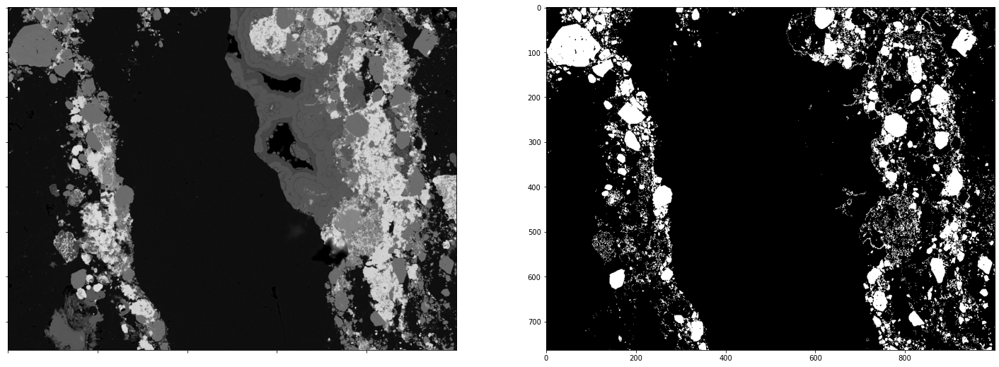

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 55628 
Percentage of Zircon is: 7.281151832460734%
# of pixels labeled as Background is: 708372 
Percentage of Background is: 92.71884816753926%
####################


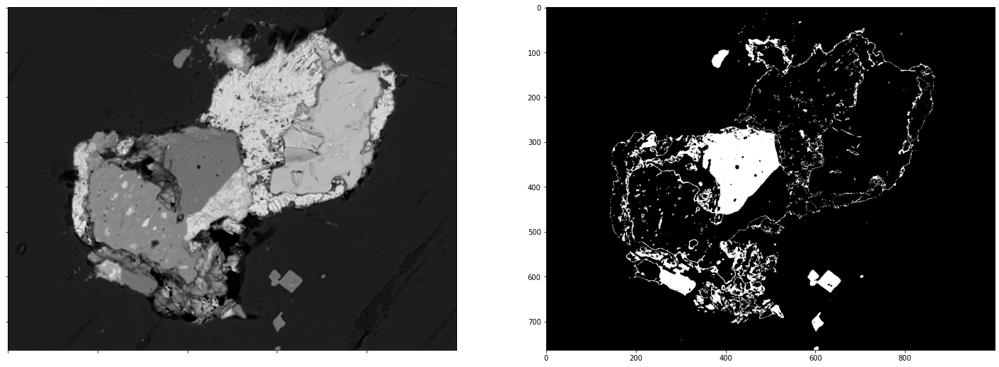

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 271927 
Percentage of Zircon is: 35.5925392670157%
# of pixels labeled as Background is: 492073 
Percentage of Background is: 64.40746073298429%
####################


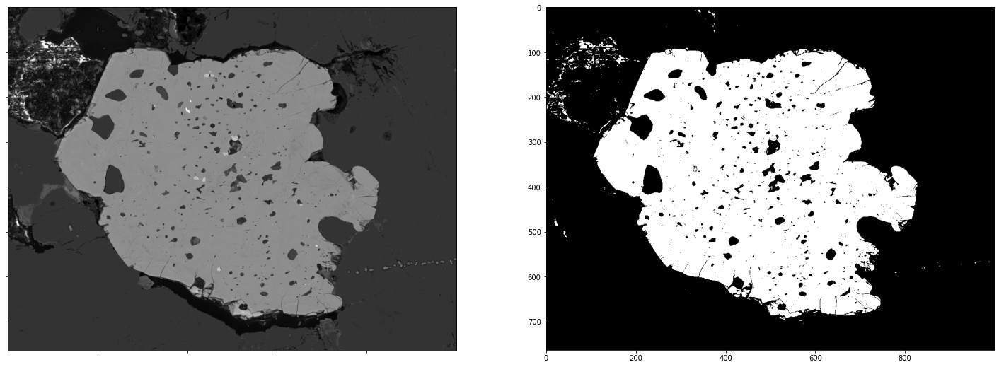

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 175439 
Percentage of Zircon is: 22.96321989528796%
# of pixels labeled as Background is: 588561 
Percentage of Background is: 77.03678010471205%
####################


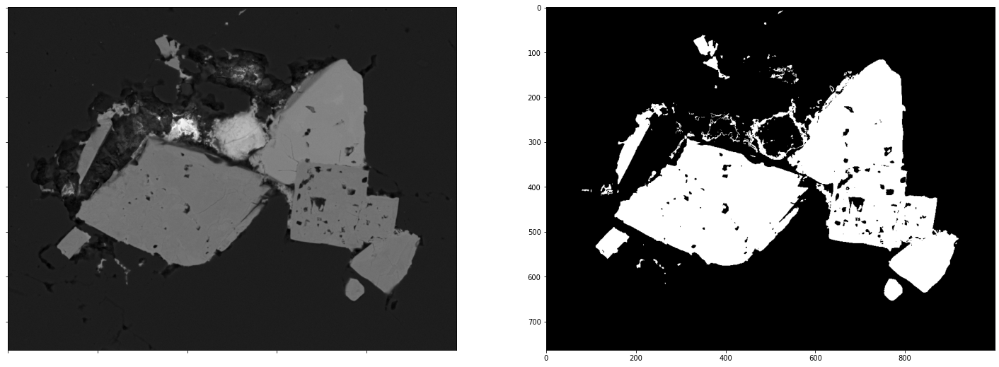

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 289730 
Percentage of Zircon is: 37.92277486910995%
# of pixels labeled as Background is: 474270 
Percentage of Background is: 62.07722513089006%
####################


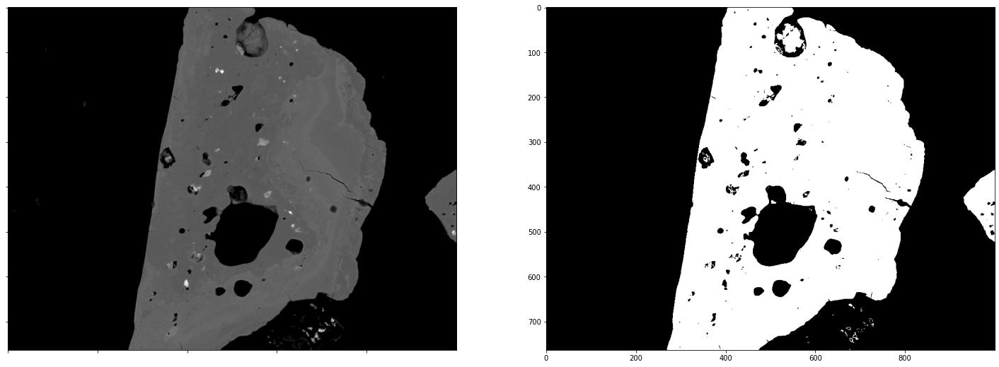

# of all pixels in a sample is: 764000
# of pixels labeled as Zircon is: 683714 
Percentage of Zircon is: 89.4913612565445%
# of pixels labeled as Background is: 80286 
Percentage of Background is: 10.508638743455498%
####################


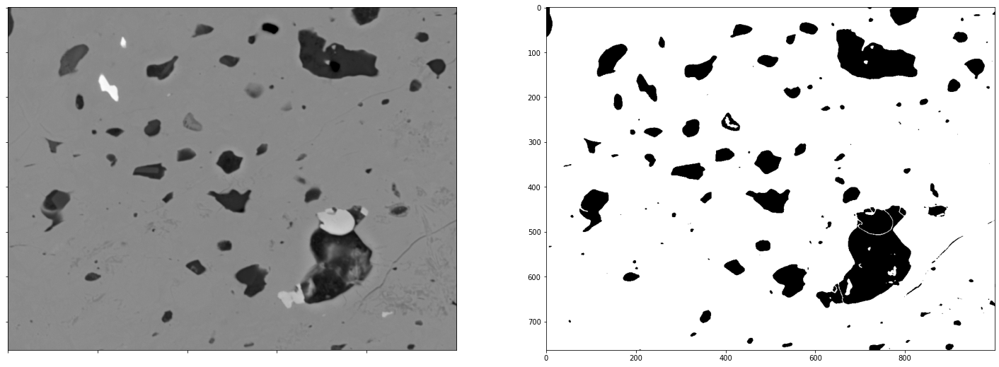

In [101]:
for i in range(masks.shape[0]):
    show_info(i)